In [1]:
from dask_gateway import Gateway, GatewayCluster
gateway = Gateway()

In [7]:
cluster.close()

In [198]:
gateway.list_clusters()

[ClusterReport<name=prod.8ca73982b2fb48778533187031c795a6, status=RUNNING>]

In [3]:
cluster = gateway.connect(gateway.list_clusters()[0].name)

In [196]:
cluster.close()

In [197]:
cluster.shutdown()

In [199]:
cluster

In [16]:
import subprocess
import logging
from distributed import WorkerPlugin

class PipPlugin(WorkerPlugin):
    """
    Install packages on a worker as it starts up.

    Parameters
    ----------
    packages : List[str]
        A list of packages to install with pip on startup.
    """
    def __init__(self, packages):
        self.packages = packages

    def setup(self, worker):
        logger = logging.getLogger("distributed.worker")
        subprocess.call(['python', '-m', 'pip', 'install', '--upgrade'] + self.packages)
        logger.info("Installed %s", self.packages)
        
class CondaPlugin(WorkerPlugin):
    """
    Install packages on a worker as it starts up, using conda

    Parameters
    ----------
    packages : List[str]
        A list of packages to install with pip on startup.
    """
    def __init__(self, packages):
        self.packages = packages

    def setup(self, worker):
        logger = logging.getLogger("distributed.worker")
        subprocess.call(['conda', 'install', '-y'] + self.packages)
        logger.info("Installed %s", self.packages)

In [17]:
if len(gateway.list_clusters())>0:
    cluster = gateway.connect(gateway.list_clusters()[-1].name)
else:
    cluster = GatewayCluster()
    # cluster.adapt(minimum=2, maximum=10)  # or cluster.scale(n) to a fixed size.
    cluster.adapt(minimum=2, maximum=100)  # or cluster.scale(n) to a fixed size.
client = cluster.get_client()

In [200]:
cluster = GatewayCluster()
cluster.adapt(minimum=2, maximum=100)  # or cluster.scale(n) to a fixed size.
client = cluster.get_client()


/srv/conda/envs/notebook/lib/python3.8/site-packages/dask_gateway/client.py:700: GatewayWarning: Adapt with `maximum=100, minimum=2` workers would exceed resource limit of 78 workers. Using `maximum=78, minimum=2` instead.
  warnings.warn(GatewayWarning(msg["msg"]))


## try installing packages on workers - important!

In [212]:
# plugin = CondaPlugin(['xskillscore'])
plugin = PipPlugin(['xskillscore'])
client.register_worker_plugin(plugin)

{'tls://10.36.34.144:39145': {'status': 'OK'},
 'tls://10.37.57.76:37255': {'status': 'OK'}}

In [213]:
# Check that installing on workers is working
def check():
    import xskillscore
    return xskillscore.__version__
# cluster.scale(2)
# client.wait_for_workers(2)
client.run(check)

{'tls://10.36.34.144:39145': '0.0.23', 'tls://10.37.57.76:37255': '0.0.23'}

In [214]:
gateway

Gateway<http://10.39.245.173:8000/services/dask-gateway>

In [215]:
cluster

In [216]:
client

Client Scheduler: gateway://traefik-gcp-uscentral1b-prod-dask-gateway.prod:80/prod.147df15488824f628f2c8bd9d04a6e4c Dashboard: /services/dask-gateway/clusters/prod.147df15488824f628f2c8bd9d04a6e4c/status,Cluster Workers: 2 Cores: 4 Memory: 17.18 GB


In [206]:
import cmip6_preprocessing

In [47]:
import dask
from dask.diagnostics import ProgressBar

In [22]:
import numpy as np
import matplotlib.pyplot as plt

In [23]:
import pandas as pd
import xarray as xr
import iris
# xr.set_options(display_style='html')
import intake
%matplotlib inline

In [24]:
import xskillscore as xs

import mosedale as bm

In [25]:
def drop_zero_dims(da):
    '''Drops coordinates that are not dimensions'''
    return da.drop([d for d in da.coords if not d in da.dims])

def lon_360_to_180(da):
    '''Use iris to set longitude to range from -180 to 180 degrees E (usually applied when longitude is defined as 0-360 degrees E)'''
    try:
        da_out = xr.DataArray.from_iris(da.to_iris().intersection(longitude=(-180,180)))
    except ValueError:
        da = drop_zero_dims(da)
        da_out = xr.DataArray.from_iris(da.to_iris().intersection(longitude=(-180,180)))
    return da_out
def lon_180_to_360(da):
    '''Use iris to set longitude to range from 0 to 360 degrees E (usually applied when longitude is defined as -180-180 degrees E)'''
    try:
        da_out = xr.DataArray.from_iris(da.to_iris().intersection(longitude=(0,360)))
    except ValueError:
        da = drop_zero_dims(da)
        da_out = xr.DataArray.from_iris(da.to_iris().intersection(longitude=(0,360)))
    return da_out

In [26]:
def is_winter(month):
    '''helper function to select winter half of year (October-March)via da.sel(time=is_winter(da['time.month'])'''
    return (month >= 10) | (month <= 3)
def is_summer(month):
    '''helper function to select summer half of year (April-September) via da.sel(time=is_summer(da['time.month'])'''
    return (month >= 4) & (month <= 9)

def get_winter(da,time='time'):
    '''Restrict a DataArray to winter months (October-March) only'''
    return da.sel({time:is_winter(da['%s.month' % time])})
def get_summer(da,time='time'):
    '''Restrict a DataArray to summer months (April-September) only'''
    return da.sel({time:is_summer(da['%s.month' % time])})

def area_da(da):
    '''Get grid box area from DataArray'''
    other_dims = [d for d in da.dims if not 'latitude' in d and not 'longitude' in d]
    area = ohf.ocean_area(da.isel({d:0 for d in other_dims}),outin=True)
    area = area.drop([c for c in area.coords if not c in area.dims])
    area.attrs = {}
    return area

def weights_da(da):
    '''
    Convenience function
    Get area weights from DataArray
    Return grid box area normalized by sum over all grid boxes: area / area.sum()
    '''
    area = area_da(da)
    return area / area.sum()

def area_weighted_mean(da,area=None):
    '''Compute area-weighted mean of a DataArray (should also work for DataSets)'''
    if area is None:
        area = area_da(da)
    weights = area / area.sum()
    return (da * weights).sum(weights.dims)

def standardize(da,dims=None):
    '''
    Standardize a field by subtracting the mean and dividing by standard deviation
    If no dimensions are provided, compute mean and std.dev. over all dimensions
    '''
    if dims is None: # over all dims
        print('Standardizing over all dimensions')
        return (da - da.mean()) / da.std()
    else: # over provided dims
        print('Standardizing over these dimensions: %s' % dims)
        return (da - da.mean(dims)) / da.std(dims)

def nao_from_std(ds,varname='psl',latname='latitude',lonname='longitude',timename='timed'):
    '''
    Compute NAO index according to Mosedale et al 2005
    From "ERA5-like" grid, i.e. -90N - 90N, starting at the South Pole

    Use 5-daymeans of psl

    - take in normalized anomalies
    - difference between area-weighted averaged psl boxes (south minus north)
    '''

    box_south = ds[varname].sel({latname:slice(55,22),lonname:slice(-90,60)})
    box_north = ds[varname].sel({latname:slice(90,55),lonname:slice(-90,60)})

    box_south_mean = area_weighted_mean(box_south)
    box_north_mean = area_weighted_mean(box_north)

    nao_mose = box_south_mean - box_north_mean
    return nao_mose.rename('NAO')

def anomalies(ds,type='time',timename='time',relname='realization'):
    '''
    Compute anomalies from seasonal cycle
    1. type "time": assumes long multi-year timeseries, single realization: Climatology by averaging over dayofyear
    2. type "ensemble": assumes short single-year timeseries, multiple realizations: Climatology by ensemble mean
    '''
    if type == 'time':
        return ds.groupby('%s.dayofyear' % timename) - ds.groupby('%s.dayofyear' % timename).mean()
    elif type ==  'ensemble':
        return ds - ds.mean(relname)


def standardize_anom_season(ds,season=None,type='time',timename='time',relname='realization'):
    '''
    Compute standardized anomalies, selecting a season only if desired
    Order of operations:
    1. Compute anomalies of type "time" or type "ensemble"
    2. Standardize over time
    3. Select values from a given season
    '''

    # Winter anomalies: anomalies -> standardize -> restrict to winter
    ds_anom = anomalies(ds,type=type,timename=timename,relname=relname)
    ds_std = standardize(ds_anom,dims=timename)
    if season == 'winter':
        print('Get winter values only')
        return get_winter(ds_std,time=timename)
    elif season == 'summer':
        print('Get summer values only')
        return get_summer(ds_std,time=timename)
    elif season is None:
        print('No season selected')
        return ds_std
    else:
        print('Season %s is undefined.')
        return None

In [48]:
cat_url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
col = intake.open_esm_datastore(cat_url)
# col

### Get MOHC model runs only

In [49]:
cat = col.search(institution_id='MOHC',table_id=['day','Oday','Eday','CFday'],variable_id=['psl','tos'])
# cat.df

### get r4i1p1f3 from HadGEM3-GC31-LL (lower res) or HadGEM3-GC31-MM (higher res)

In [50]:
# cat_hadgem3 = cat.search(variable_id=['tos','psl'],experiment_id='historical',source_id='HadGEM3-GC31-MM',member_id='r4i1p1f3')
cat_hadgem3_ll = cat.search(variable_id=['tos','psl'],experiment_id='historical',source_id='HadGEM3-GC31-LL',member_id='r4i1p1f3')

In [51]:
dset_dict = cat_hadgem3_ll.to_dataset_dict(zarr_kwargs={'consolidated': True})


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


In [52]:
list(dset_dict.keys())


['CMIP.MOHC.HadGEM3-GC31-LL.historical.day.gn',
 'CMIP.MOHC.HadGEM3-GC31-LL.historical.Oday.gn']

In [53]:
# areacella = xr.open_dataset('areacella_fx_HadGEM3-GC31-MM_piControl_r1i1p1f1_gn.nc')
# areacello = xr.open_dataset('areacello_Ofx_HadGEM3-GC31-MM_piControl_r1i1p1f1_gn.nc')

areacella = xr.open_dataset('areacella_fx_HadGEM3-GC31-LL_piControl_r1i1p1f1_gn.nc')
areacello = xr.open_dataset('areacello_Ofx_HadGEM3-GC31-LL_piControl_r1i1p1f1_gn.nc')

### Assemble dataset

In [54]:
# ds = xr.merge([
#     dset_dict['CMIP.MOHC.HadGEM3-GC31-MM.historical.day.gn']['psl'],
#     dset_dict['CMIP.MOHC.HadGEM3-GC31-MM.historical.Oday.gn']['tos'],
#     areacella,
#     areacello
# ]).isel(lat=slice(None,None,-1))

ds0 = xr.merge([
    dset_dict['CMIP.MOHC.HadGEM3-GC31-LL.historical.day.gn']['psl'],
    dset_dict['CMIP.MOHC.HadGEM3-GC31-LL.historical.Oday.gn']['tos'],
    areacella,
    areacello
])#.isel(lat=slice(None,None,-1))

In [55]:
print('The dataset ds has %.1f GB of data' % (ds0.nbytes / 1e9))

The dataset ds has 34.8 GB of data


# Testing trends & detrending

In [56]:
def trend_dataarray(da, dim='time', deg=1):
    '''Given a DataArray, returns a trend over dimension dim using np.polyfit.
    
    Parameters:
        da : xarray.DataArray
            da timeseries. Needs to at least have dimension <dim>, can have more
        dim: dimension over which to compute the trend
        deg: degree of the polynomial fit (default: 1==linear)
            
    Returns:
        trend_da : xarray.DataArray
            fitted trend of da.
    
    Credit goes to Ryan Abernathey and Aiden Robert from this webpage: https://gist.github.com/rabernat/
    1ea82bb067c3273a6166d1b1f77d490f#file-detrend_xarray-py
    '''
    # needed to workaround xarray's check with zero dimensions
    # https://github.com/pydata/xarray/issues/3575
    if len(da[dim]) == 0:
        return da
    
    p = da.polyfit(dim=dim, deg=deg)
    fit = xr.polyval(da[dim], p.polyfit_coefficients)
    return fit.rename(da.name)

def detrend_dataarray(da, dim='time', deg=1):
    '''Given a DataArray, returns a detrended dataset using np.polyfit.
    
    Parameters:
        da : xarray.DataArray
            da timeseries. Needs to at least have dimension <dim>, can have more
        dim: dimension over which to compute the trend
        deg: degree of the polynomial fit (default: 1==linear)
          
    Returns:
        detrended_da : xarray.DataArray
            Detrended DataArray.
    
    Credit goes to Ryan Abernathey and Aiden Robert from this webpage: https://gist.github.com/rabernat/
    1ea82bb067c3273a6166d1b1f77d490f#file-detrend_xarray-py
    '''
    # needed to workaround xarray's check with zero dimensions
    # https://github.com/pydata/xarray/issues/3575
    if len(da[dim]) == 0:
        return da
    
    p = da.polyfit(dim=dim, deg=deg)
    fit = xr.polyval(da[dim], p.polyfit_coefficients)
    return (da - fit).rename(da.name)

def remove_seasonal_cycle(da, dim='time', groupby='dayofyear', window=None):
    '''Given a timeseries of daily dynamic sea level (dsl), returns the sea level anomaly (sla).
    A 10-day rolling average is used to smoothen the computed seasonal cycle.
    
    Parameters:
        dsl : xarray.DataArray
            Dynamic sea level timeseries.
        groupby : string
            How to group the timeseries for the seasonal cycle. For instance, groupby='dayofyear'
            gives the 
        window : int
            Integer indicating length of rolling window for smoothening the seasonal cycle.
    Returns:
        sla : xarray.DataArray
            Sea level anomalies.
    '''
    
    seasonal_cycle = da.groupby(dim + '.' + groupby).mean()#.compute()
    if type(window) == int:
        seasonal_cycle = seasonal_cycle.rolling(dayofyear=window, center=True).mean()#.compute()

    sla = da.groupby(dim + '.'+groupby) - seasonal_cycle
#     sla = da - da.mean(dim='time')
#     sla = sla.compute()
    return sla

## Map of trends over 2004-2014

In [91]:
# trend_dataarray(tos_ds)
# tos_ds.polyfit(dim='time', deg=1)['polyfit_coefficients'].sel(degree=1).plot()
slope_deg_per_day = ds0['tos'].sel(time=slice('2004',None)).squeeze().polyfit(dim='time', deg=1)['polyfit_coefficients'].sel(degree=1)

In [95]:
with ProgressBar():
    slope_deg_per_day.load()

In [123]:
slope_deg_per_day['latitude'] = ds0['latitude']
slope_deg_per_day['longitude'] = ds0['longitude']

In [101]:
import cartopy.crs as ccrs

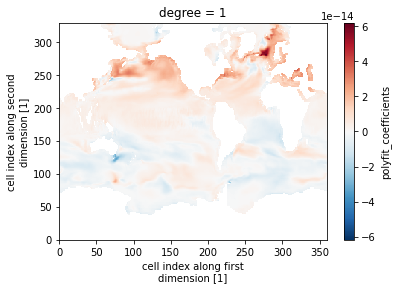

In [132]:
# (slope_deg_per_day * 365.25*10).plot(subplot_kws={'projection':ccrs.PlateCarree()})
# (slope_deg_per_day * 365.25*10).plot(x='longitude',y='latitude',subplot_kws={'projection':ccrs.PlateCarree()})
(slope_deg_per_day * 365.25*10).plot()

In [133]:
slope_deg_per_day.argmax()

<xarray.DataArray 'polyfit_coefficients' ()>
array(101798)
Coordinates:
    degree   int64 1

In [146]:
slope_deg_per_day.stack(ij=['j','i'])[101798]

<xarray.DataArray 'polyfit_coefficients' ()>
array(1.6986327e-17)
Coordinates:
    degree     int64 1
    longitude  float32 -3.589
    latitude   float32 64.72
    ij         object (282, 278)

In [148]:
ds0['tos'].sel(j=282,i=278)

<xarray.DataArray 'tos' (member_id: 1, time: 59400)>
dask.array<getitem, shape=(1, 59400), dtype=float32, chunksize=(1, 251), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 1850-01-01 12:00:00 ... 2014-12-30 12:00:00
  * member_id  (member_id) <U8 'r4i1p1f3'
    i          int32 278
    j          int32 282
    latitude   float32 64.72
    longitude  float32 -3.589
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Temperature of upper boundary of the liquid ocean, includ...
    long_name:      Sea Surface Temperature
    original_name:  mo: (variable_name: tos)
    standard_name:  sea_surface_temperature
    units:          degC

In [138]:
with ProgressBar():
#     tos_ts = ds0['tos'].sel(i=140,j=180).squeeze().load()
    tos_ts = ds0['tos'].sel(i=282,j=278).squeeze().load()

In [149]:
with ProgressBar():
#     tos_ts = ds0['tos'].sel(i=140,j=180).squeeze().load()
    tos_ts2 = ds0['tos'].sel(j=282,i=278).squeeze().load()

In [24]:
with ProgressBar():
    tos_ds = ds0['tos'].sel(time=slice('1979',None),i=slice(140,144),j=slice(180,185)).squeeze().load()

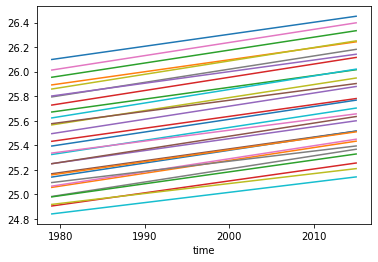

In [59]:
trend_dataarray(tos_ds,'time',1).stack(ij=['i','j']).plot.line(x='time',add_legend=False)

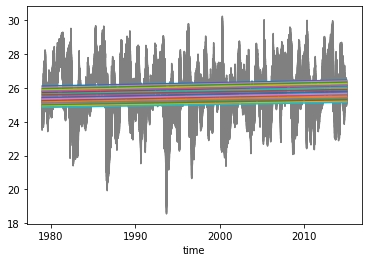

In [60]:
tos_ds.stack(ij=['i','j']).plot.line(x='time',add_legend=False,color='grey')
trend_dataarray(tos_ds,'time',1).stack(ij=['i','j']).plot.line(x='time',add_legend=False)

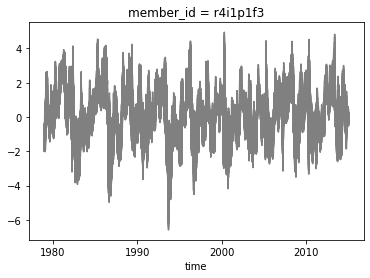

In [64]:
# tos_ds.groupby('time.year').mean().stack(ij=['i','j']).plot.line(x='year',add_legend=False,color='grey')
detrend_dataarray(tos_ds,'time',1).stack(ij=['i','j']).plot.line(x='time',add_legend=False,color='grey')

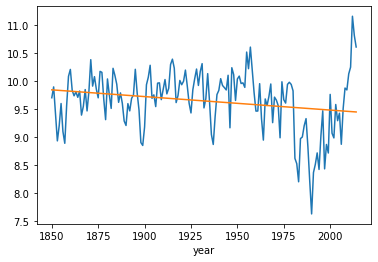

In [139]:
tos_ts.groupby('time.year').mean().plot()
trend_dataarray(tos_ts.groupby('time.year').mean(),'year',1).plot()

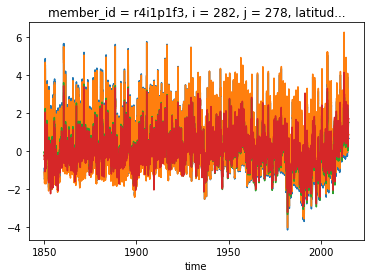

In [140]:
(tos_ts - tos_ts.mean()).plot()
detrend_dataarray(tos_ts,'time',1).plot()
remove_seasonal_cycle(tos_ts).plot()
remove_seasonal_cycle(detrend_dataarray(tos_ts,'time',1)).plot()

Text(0.5, 1.0, 'histogram of SST a (0.0 E, 62.0 N)')

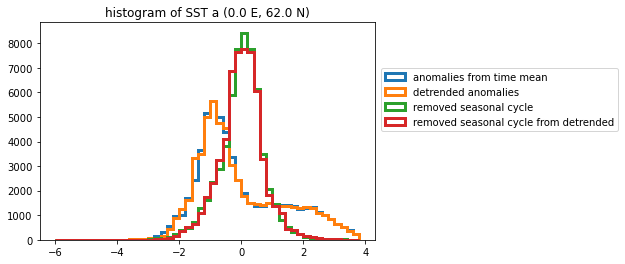

In [145]:
(tos_ts - tos_ts.mean()).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
detrend_dataarray(tos_ts,'time',1).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
remove_seasonal_cycle(tos_ts).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
remove_seasonal_cycle(detrend_dataarray(tos_ts,'time',1)).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
plt.legend(['anomalies from time mean','detrended anomalies','removed seasonal cycle','removed seasonal cycle from detrended'],loc=(1.02,0.5))
plt.title('histogram of SST a (%.1f E, %.1f N)' % (tos_ts['longitude'],tos_ts['latitude']))

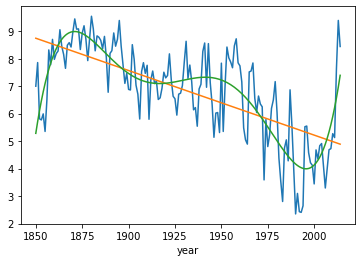

In [216]:
tos_ts2.groupby('time.year').mean().plot()
trend_dataarray(tos_ts2.groupby('time.year').mean(),'year',1).plot()
trend_dataarray(tos_ts2.groupby('time.year').mean(),'year',5).plot()

Text(0.5, 1.0, 'SST at (-3.6 E, 64.7 N)')

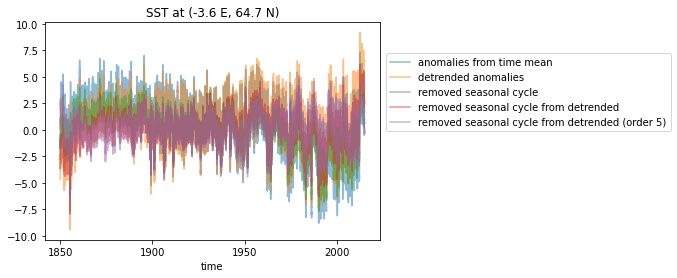

In [217]:
(tos_ts2 - tos_ts2.mean()).plot(alpha=0.5)
detrend_dataarray(tos_ts2,'time',1).plot(alpha=0.5)
remove_seasonal_cycle(tos_ts2).plot(alpha=0.5)
remove_seasonal_cycle(detrend_dataarray(tos_ts2,'time',1)).plot(alpha=0.5)
remove_seasonal_cycle(detrend_dataarray(tos_ts2,'time',5)).plot(alpha=0.5)
plt.legend(['anomalies from time mean','detrended anomalies','removed seasonal cycle','removed seasonal cycle from detrended','removed seasonal cycle from detrended (order 5)'],loc=(1.02,0.5))

plt.title('SST at (%.1f E, %.1f N)' % (tos_ts2['longitude'],tos_ts2['latitude']))

Text(0.5, 1.0, 'histogram of SST at (-3.6 E, 64.7 N)')

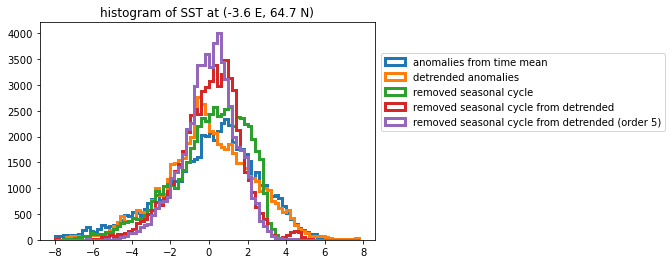

In [218]:
bins = np.arange(-8,8,0.2)
(tos_ts2 - tos_ts2.mean()).plot.hist(bins=bins,histtype='step',lw=3)
detrend_dataarray(tos_ts2,'time',1).plot.hist(bins=bins,histtype='step',lw=3)
remove_seasonal_cycle(tos_ts2).plot.hist(bins=bins,histtype='step',lw=3)
remove_seasonal_cycle(detrend_dataarray(tos_ts2,'time',1)).plot.hist(bins=bins,histtype='step',lw=3)
remove_seasonal_cycle(detrend_dataarray(tos_ts2,'time',5)).plot.hist(bins=bins,histtype='step',lw=3)
plt.legend(['anomalies from time mean','detrended anomalies','removed seasonal cycle','removed seasonal cycle from detrended','removed seasonal cycle from detrended (order 5)'],loc=(1.02,0.5))
plt.title('histogram of SST at (%.1f E, %.1f N)' % (tos_ts2['longitude'],tos_ts2['latitude']))

In [159]:
pd

<module 'pandas' from '/srv/conda/envs/notebook/lib/python3.8/site-packages/pandas/__init__.py'>

In [ ]:
aa = (tos_ts2 - tos_ts2.mean()).to_dataframe().iloc[:10,-1]#['tos']

In [205]:
lags = np.arange(360)
acf = [(tos_ts2 - tos_ts2.mean()).to_pandas().autocorr(lag=lag) for lag in lags]
acf = pd.Series(index=lags,data=acf)

In [107]:
def autocorr(da,lags):
    acf = [da.to_pandas().autocorr(lag=lag) for lag in lags]
    acf = pd.Series(index=lags,data=acf)
    return acf

Text(0.5, 0, 'lag (days)')

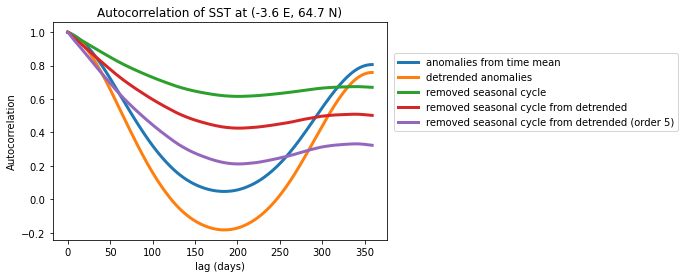

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError
Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/srv/conda/envs/notebook/lib/python3.8/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLCertVerificationError: [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: self signed certificate (_ssl.c:1124)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/asyncio/events.py", line 81, in _run
    self._context.run(self._callback, *self._args)
  File "/srv/conda/envs/notebook/lib/p

In [220]:
lags = np.arange(360)
autocorr((tos_ts2 - tos_ts2.mean()),lags).plot(lw=3)
autocorr(detrend_dataarray(tos_ts2,'time',1),lags).plot(lw=3)
autocorr(remove_seasonal_cycle(tos_ts2),lags).plot(lw=3)
autocorr(remove_seasonal_cycle(detrend_dataarray(tos_ts2,'time',1)),lags).plot(lw=3)
autocorr(remove_seasonal_cycle(detrend_dataarray(tos_ts2,'time',5)),lags).plot(lw=3)
plt.legend(['anomalies from time mean','detrended anomalies','removed seasonal cycle','removed seasonal cycle from detrended','removed seasonal cycle from detrended (order 5)'],loc=(1.02,0.5))
plt.title('Autocorrelation of SST at (%.1f E, %.1f N)' % (tos_ts2['longitude'],tos_ts2['latitude']))
plt.ylabel('Autocorrelation')
plt.xlabel("lag (days)")

## trends etc. before at ds0['tos'].sel(i=140,j=180)

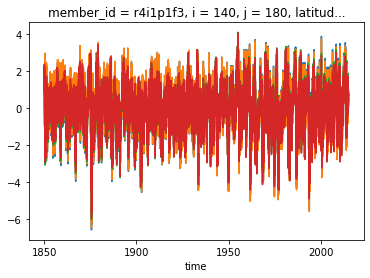

In [70]:
(tos_ts - tos_ts.mean()).plot()
detrend_dataarray(tos_ts,'time',1).plot()
remove_seasonal_cycle(tos_ts).plot()
remove_seasonal_cycle(detrend_dataarray(tos_ts,'time',1)).plot()

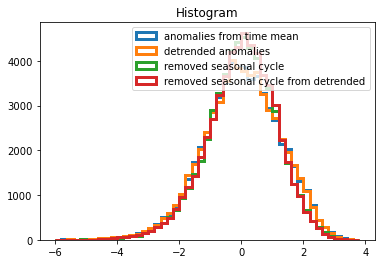

In [73]:
(tos_ts - tos_ts.mean()).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
detrend_dataarray(tos_ts,'time',1).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
remove_seasonal_cycle(tos_ts).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
remove_seasonal_cycle(detrend_dataarray(tos_ts,'time',1)).plot.hist(bins=np.arange(-6,4,0.2),histtype='step',lw=3)
plt.legend(['anomalies from time mean','detrended anomalies','removed seasonal cycle','removed seasonal cycle from detrended'])

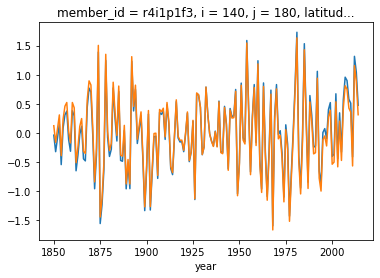

In [68]:
(tos_ts.groupby('time.year').mean() - tos_ts.groupby('time.year').mean().mean('year')).plot()
detrend_dataarray(tos_ts.groupby('time.year').mean(),'year').plot()
# trend_dataarray(tos_ts.groupby('time.year').mean(),'year').plot()

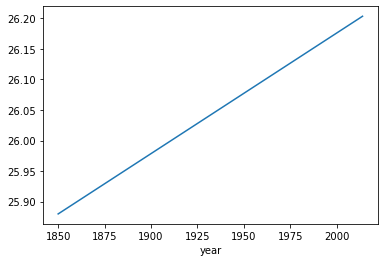

In [63]:
1

1

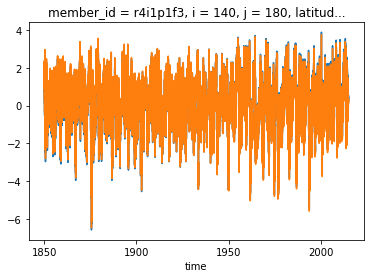

In [61]:
(tos_ts - tos_ts.mean('time')).plot()
detrend_dataarray(tos_ts).plot()

In [186]:
ds0

,Array,Chunk
Bytes,6.57 GB,103.85 MB
Shape,"(1, 59400, 144, 192)","(1, 939, 144, 192)"
Count,129 Tasks,64 Chunks
Type,float32,numpy.ndarray
,Array,Chunk
Bytes,28.23 GB,119.28 MB
Shape,"(1, 59400, 330, 360)","(1, 251, 330, 360)"
Count,475 Tasks,237 Chunks
Type,float32,numpy.ndarray


## 5-daily averaging if requested, set latitude to -180-180

In [247]:
# time = 'time' # use daily
time = 'time5d' # use 5-daily instead of daily

In [248]:
# ds1 = ds0
# ds1 = ds0.sel(time=slice('1851')) # 2 years, works: 14.6 seconds
# ds1 = ds0.sel(time=slice('1854')) # 5 years, works: 23.2 seconds
# ds1 = ds0.sel(time=slice('1853')) # 4 years, works: 27.7 seconds
# ds1 = ds0.sel(time=slice('1857')) # 4 years, works:  67.3 seconds
# ds1 = ds0.sel(time=slice('1860')) # 10 years, works (with & without detrending): 48 seconds
# ds1 = ds0.sel(time=slice('1865')) # 15 years, works: 84.2 seconds
ds1 = ds0.sel(time=slice('1866')) # 16 years, works: X seconds
# ds1 = ds0.sel(time=slice('1870')) # 20 years, crashed
# ds1 = ds0.sel(time=slice('1979',None)) # 35 years, keeps crashing

In [249]:
with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    # Pick fields and set longitude to -180-180, and reset member_id for psl
    if time == 'time5d':
        print('Perform 5-daily averaging')
        ds = xr.merge([
            ds1['tos'].resample({'time':'5D'},loffset=pd.Timedelta('2.5D')).mean().rename({'time':time}).squeeze(drop=True),
            ds1['areacello'],
    #         lon_360_to_180(ds0['psl']).rename({'dim_0':'member_id'}).assign_coords({'member_id':ds0['member_id']}).resample({'time':'5D'},loffset=pd.Timedelta('2.5D')).mean().rename({'time':time}).squeeze(drop=True),
    #         lon_360_to_180(ds0['areacella'])
            ds1['psl'].assign_coords(lon=(ds1['lon']+180)%360-180).sortby('lon').resample({'time':'5D'},loffset=pd.Timedelta('2.5D')).mean().rename({'time':time}).squeeze(drop=True),
            ds1['areacella'].assign_coords(lon=(ds1['lon']+180)%360-180).sortby('lon')

        ])
    else:
        print('Keep daily data')
        ds = xr.merge([
            ds1['tos'],
            ds1['areacello'],
    #         lon_360_to_180(ds0['psl']).rename({'dim_0':'member_id'}).assign_coords({'member_id':ds0['member_id']}),
    #         lon_360_to_180(ds0['areacella'])
            ds1['psl'].assign_coords(lon=(ds1['lon']+180)%360-180).sortby('lon'),
            ds1['areacella'].assign_coords(lon=(ds1['lon']+180)%360-180).sortby('lon')
        ])

    # Re-order atmosphere-grid latitude
    ds = ds.isel(lat=slice(None,None,-1))
    # Get back dataset-level attributes
    ds.attrs = ds0.attrs

Perform 5-daily averaging


In [250]:
print('The input dataset ds has %.1f GB of data' % (ds.nbytes / 1e9))

The input dataset ds has 0.7 GB of data


### Detrend

In [251]:
ds = xr.merge([
    detrend_dataarray(ds['tos'],dim='time5d',deg=1),
    ds['areacello'],
    detrend_dataarray(ds['psl'],dim='time5d',deg=1),
    ds['areacella']
])

### Compute winter standardized anomalies

In [252]:
#ds_std_anom = standardize_anom_season(ds,season='winter',type='time',timename='time')
# ds_std_anom = standardize_anom_season(ds[['psl','tos']],season='winter',type='time',timename='time')
ds_std_anom = standardize_anom_season(ds[['psl','tos']],season='winter',type='time',timename='time5d')

Standardizing over these dimensions: time5d
Get winter values only


In [253]:
print('Computing NAO')
box_south = ds_std_anom['psl'].sel({'lat':slice(55,22),'lon':slice(-90,60)})
box_north = ds_std_anom['psl'].sel({'lat':slice(90,55),'lon':slice(-90,60)})

area_south = ds['areacella'].sel({'lat':slice(55,22),'lon':slice(-90,60)})
area_north = ds['areacella'].sel({'lat':slice(90,55),'lon':slice(-90,60)})
weights_south = area_south / area_south.sum()
weights_north = area_north / area_north.sum()

box_south_mean = (box_south * weights_south).sum(weights_south.dims)
box_north_mean = (box_north * weights_north).sum(weights_north.dims)

nao_mose = box_south_mean - box_north_mean
nao_mose = nao_mose.rename('NAO')

Computing NAO


with ProgressBar():
    nao_mose.load()

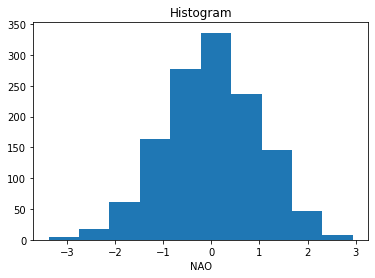

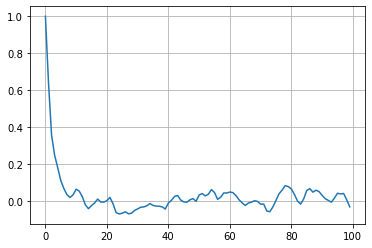

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/srv/conda/envs/notebook/lib/python3.8/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLCertVerificationError: [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: self signed certificate (_ssl.c:1124)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/asyncio/events.py", line 81, in _run
    self._context.run(self._callback, *self._args)
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle

In [109]:
nao_mose.plot.hist()
plt.figure()
autocorr(nao_mose,lags=np.arange(100)).plot()
plt.grid(True)

In [254]:
# Compute patterns
print('Computing pattern correlations')

# using xskillscore
pattern_nao = xs.pearson_r(nao_mose.chunk(dict({time:-1})),ds_std_anom['psl'].fillna(0.).chunk(dict({time:-1})),dim=['time5d']).rename('r_NAO_psl')
pattern_sst = xs.pearson_r(nao_mose.chunk(dict({time:-1})),ds_std_anom['tos'].fillna(0.).chunk(dict({time:-1})),dim=['time5d']).rename('r_NAO_sst')

# using xr.corr
# pattern_nao = xr.corr(nao_mose,ds_std_anom['psl'].fillna(0.),dim=['time5d']).rename('r_NAO_psl')
# pattern_sst = xr.corr(nao_mose,ds_std_anom['tos'].fillna(0.),dim=['time5d']).rename('r_NAO_sst')

Computing pattern correlations


with ProgressBar():
    pattern_nao.load()

In [118]:
import cartopy.crs as ccrs

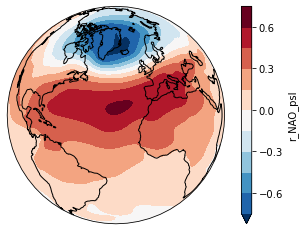

In [119]:
pattern_nao.plot.contourf(levels=np.arange(-0.75,0.75+0.15,0.15),subplot_kws={'projection':ccrs.Orthographic(central_latitude=30,central_longitude=-30)},transform=ccrs.PlateCarree())
plt.gca().coastlines()

with ProgressBar():
    pattern_sst.load()

In [255]:
# Compute tripole index
print('Computing pattern tripole')
# tripole = (ds_std_anom['tos'] * pattern_sst.sel(longitude=slice(-95,-10),latitude=slice(70,0))).sum(['latitude','longitude']).rename('Tripole')
tripole = (ds_std_anom['tos'] * pattern_sst.where(lambda x: (x['latitude'] > 0) & (x['latitude']< 70) & (x['longitude'] > -95) & (x['longitude'] < -10)) ).sum(['i','j']).rename('Tripole')

Computing pattern tripole


In [256]:
# Merge & compute
ds_out = xr.merge([
    nao_mose,
    tripole,
    pattern_nao,
    pattern_sst
])

In [257]:
print('The output dataset ds has %.1f MB of data' % (ds_out.nbytes / 1e6))

The output dataset ds has 2.1 MB of data


In [258]:
ds_out

<xarray.Dataset>
Dimensions:    (i: 360, j: 330, lat: 144, lon: 192, time5d: 612)
Coordinates:
  * time5d     (time5d) object 1850-01-03 12:00:00 ... 1866-12-28 12:00:00
    dayofyear  (time5d) int64 3 8 13 18 23 28 33 ... 328 333 338 343 348 353 358
  * lat        (lat) float64 89.38 88.12 86.88 85.62 ... -86.88 -88.12 -89.38
  * lon        (lon) float64 -179.1 -177.2 -175.3 -173.4 ... 175.3 177.2 179.1
  * j          (j) int32 0 1 2 3 4 5 6 7 8 ... 322 323 324 325 326 327 328 329
  * i          (i) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
    latitude   (j, i) float32 dask.array<chunksize=(330, 360), meta=np.ndarray>
    longitude  (j, i) float32 dask.array<chunksize=(330, 360), meta=np.ndarray>
Data variables:
    NAO        (time5d) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    Tripole    (time5d) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    r_NAO_psl  (lat, lon) float64 dask.array<chunksize=(144, 192), meta=np.ndarray>
    r_NAO_sst  (j, i) float64 dask.array<chunksize=(330, 360), meta=np.ndarray>

In [259]:
import time as T

In [260]:
start = T.time()
with ProgressBar():
    ds_out.load()
end = T.time()

In [261]:
print('Took %.1f seconds for 16 years' % (end-start))


Took 116.3 seconds for 16 years


In [246]:
print('Took %.1f seconds for 8 years' % (end-start))


Took 67.3 seconds for 8 years


In [231]:
print('Took %.1f seconds for 4 years' % (end-start))


Took 27.7 seconds for 4 years


In [166]:
print('Took %.1f seconds for 15 years' % (end-start))

Took 84.2 seconds for 15 years


In [152]:
print('Took %.1f seconds for 5 years' % (end-start))

Took 23.2 seconds for 5 years


In [137]:
print('Took %.1f seconds for 2 years' % (end-start))

Took 14.6 seconds for 2 years


In [108]:
print('Took %.1f seconds for 10 years' % (end-start))

Took 48.0 seconds for 10 years


In [264]:
runtime = pd.Series(index=[2,4,5,8,10,15,16],data=[14.6,27.7,23.2,67.3,48,84.2,116.3])
runtime1 = pd.Series(index=[2,5,10,15],data=[14.6,23.2,48,84.2])
runtime2 = pd.Series(index=[4,8,16],data=[27.7,67.3,116.3])

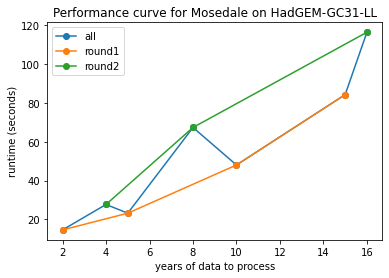

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/srv/conda/envs/notebook/lib/python3.8/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLCertVerificationError: [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: self signed certificate (_ssl.c:1124)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/asyncio/events.py", line 81, in _run
    self._context.run(self._callback, *self._args)
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle

In [267]:
runtime.plot(style='o-')
runtime1.plot(style='o-')
runtime2.plot(style='o-')
# plt.semilogy()
plt.xlabel('years of data to process')
plt.ylabel('runtime (seconds)')
plt.title('Performance curve for Mosedale on HadGEM-GC31-LL')
plt.legend(['all','round1','round2'])
plt.savefig('mosedale_hadgem_benchmark.pdf')

In [181]:
client.get_worker_logs()

AttributeError: 'NoneType' object has no attribute 'worker_logs'

In [206]:
logs2 = client.get_worker_logs()

In [209]:
cluster.get_client().get_worker_logs()

{'tls://10.37.21.35:33859': (('INFO',
   'distributed.worker - INFO -       Start worker at:    tls://10.37.21.35:33859'),
  ('INFO',
   'distributed.worker - INFO -          Listening to:    tls://10.37.21.35:33859'),
  ('INFO',
   'distributed.worker - INFO -          dashboard at:           10.37.21.35:8787'),
  ('INFO',
   'distributed.worker - INFO - Waiting to connect to: tls://dask-3702d11de562427192d170098aeccca7.prod:8786'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO -               Threads:                          2'),
  ('INFO',
   'distributed.worker - INFO -                Memory:                    8.59 GB'),
  ('INFO',
   'distributed.worker - INFO -       Local Directory: /home/jovyan/dask-worker-space/dask-worker-space/worker-b46xjgsy'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO - S

In [207]:
logs2

{'tls://10.37.21.35:33859': (('INFO',
   'distributed.worker - INFO -       Start worker at:    tls://10.37.21.35:33859'),
  ('INFO',
   'distributed.worker - INFO -          Listening to:    tls://10.37.21.35:33859'),
  ('INFO',
   'distributed.worker - INFO -          dashboard at:           10.37.21.35:8787'),
  ('INFO',
   'distributed.worker - INFO - Waiting to connect to: tls://dask-3702d11de562427192d170098aeccca7.prod:8786'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO -               Threads:                          2'),
  ('INFO',
   'distributed.worker - INFO -                Memory:                    8.59 GB'),
  ('INFO',
   'distributed.worker - INFO -       Local Directory: /home/jovyan/dask-worker-space/dask-worker-space/worker-b46xjgsy'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO - S

(array([13., 21., 20., 32., 57., 65., 95., 66., 21.,  6.]),
 array([-765.80528325, -625.34462283, -484.88396241, -344.42330199,
        -203.96264156,  -63.50198114,   76.95867928,  217.4193397 ,
         357.88000012,  498.34066054,  638.80132097]),
 <BarContainer object of 10 artists>)

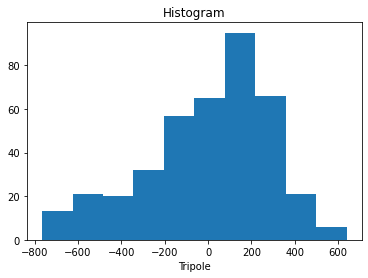

In [181]:
# ds_out['Tripole'].plot()
ds_out['Tripole'].plot.hist()
# ds_out['NAO'].plot.hist()

Standardizing over all dimensions


(array([13., 21., 20., 32., 57., 65., 95., 66., 21.,  6.]),
 array([-2.65912466, -2.17139963, -1.6836746 , -1.19594957, -0.70822453,
        -0.2204995 ,  0.26722553,  0.75495056,  1.24267559,  1.73040062,
         2.21812565]),
 <BarContainer object of 10 artists>)

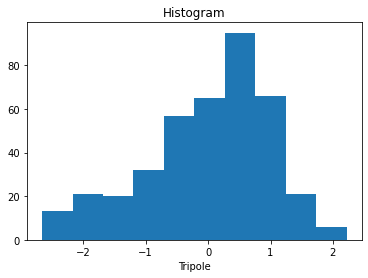

In [182]:
standardize(ds_out['Tripole']).plot.hist()

Standardizing over all dimensions


<AxesSubplot:>

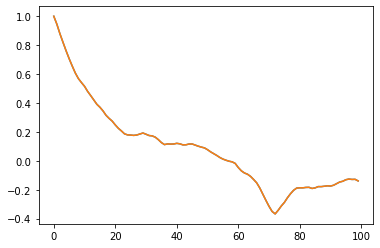

In [183]:
autocorr(ds_out['Tripole'],lags=np.arange(100)).plot()
autocorr(standardize(ds_out['Tripole']),lags=np.arange(100)).plot()

(array([14., 19., 20., 39., 52., 66., 95., 62., 23.,  6.]),
 array([-799.4683 , -652.34186, -505.21545, -358.089  , -210.96255,
         -63.83612,   83.29032,  230.41676,  377.5432 ,  524.6696 ,
         671.7961 ], dtype=float32),
 <BarContainer object of 10 artists>)

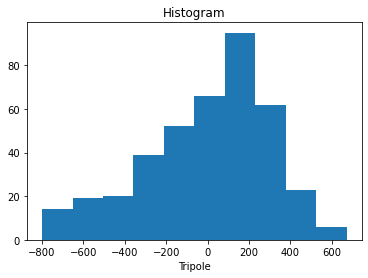

In [137]:
# ds_out['Tripole'].plot()
ds_out['Tripole'].plot.hist()
# ds_out['NAO'].plot.hist()

Standardizing over all dimensions


(array([14., 19., 20., 39., 52., 66., 95., 62., 23.,  6.]),
 array([-2.64738067, -2.16018226, -1.67298385, -1.18578544, -0.69858704,
        -0.21138863,  0.27580978,  0.76300819,  1.2502066 ,  1.737405  ,
         2.22460341]),
 <BarContainer object of 10 artists>)

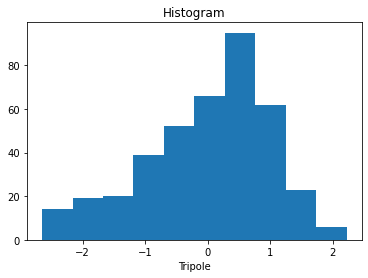

In [139]:
standardize(ds_out['Tripole']).plot.hist()

Standardizing over all dimensions


<AxesSubplot:>

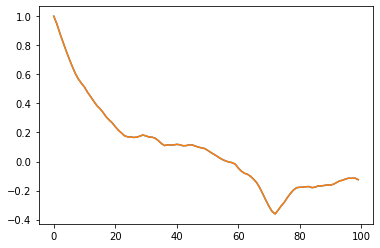

In [144]:
autocorr(ds_out['Tripole'],lags=np.arange(100)).plot()
autocorr(standardize(ds_out['Tripole']),lags=np.arange(100)).plot()

In [35]:
fig = display(ds_out['NAO'].data.visualize())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.449115 to fit


In [39]:
ds_out['NAO'].data.visualize(filename='NAO_dask_task_graph.pdf')

In [40]:
ds_out['NAO'].data.visualize(filename='NAO_dask_task_graph_v2.pdf',optimize_graph=True)

In [108]:
ds_out

<xarray.Dataset>
Dimensions:    (i: 360, j: 330, lat: 144, lon: 192, time5d: 72)
Coordinates:
  * time5d     (time5d) object 1850-01-03 12:00:00 ... 1851-12-28 12:00:00
    dayofyear  (time5d) int64 3 8 13 18 23 28 33 ... 328 333 338 343 348 353 358
  * lat        (lat) float64 89.38 88.12 86.88 85.62 ... -86.88 -88.12 -89.38
  * lon        (lon) float64 -179.1 -177.2 -175.3 -173.4 ... 175.3 177.2 179.1
  * j          (j) int32 0 1 2 3 4 5 6 7 8 ... 322 323 324 325 326 327 328 329
  * i          (i) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
    latitude   (j, i) float32 -84.11 -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 73.5 74.5 75.5 76.5 ... 72.93 72.95 72.96 72.99
Data variables:
    NAO        (time5d) float32 0.1056 -0.1846 -0.8552 ... 1.494 0.5191 0.01209
    Tripole    (time5d) float32 -809.2 -1.008e+03 -870.6 ... 607.4 635.5 698.6
    r_NAO_psl  (lat, lon) float32 -0.5615 -0.5617 -0.562 ... -0.06016 -0.05985
    r_NAO_sst  (j, i) float32 nan nan nan nan nan nan ... nan nan nan nan nan

In [41]:
with ProgressBar():
    ds_out['NAO'].load()

In [107]:
ds_out['NAO']#.plot()

<xarray.DataArray 'NAO' (time5d: 72)>
array([ 0.10559058, -0.18460807, -0.85523045, -2.1527543 , -3.3701108 ,
       -1.583961  , -0.9682479 , -1.3472513 , -0.18909208,  0.5415865 ,
       -0.42902967, -0.01004286,  0.26821563,  0.14605324, -0.9900615 ,
        0.4120253 , -0.03097832, -0.744454  ,  1.0047822 ,  0.28585356,
        0.2233249 ,  0.19704711, -0.12595826, -0.8020299 , -1.0131357 ,
       -1.5371375 , -1.5182424 , -0.39468497, -0.97053874, -0.98123014,
       -0.5414984 , -0.01303288,  0.05678344, -1.4935929 , -0.5190575 ,
       -0.0120904 , -0.1055904 ,  0.18460748,  0.85523003,  2.1527536 ,
        3.3701115 ,  1.5839609 ,  0.96824807,  1.3472515 ,  0.18909292,
       -0.54158694,  0.42902976,  0.01004256, -0.26821637, -0.14605346,
        0.9900624 , -0.4120267 ,  0.03097852,  0.7444541 , -1.0047818 ,
       -0.28585288, -0.22332555, -0.19704735,  0.12595783,  0.8020302 ,
        1.0131351 ,  1.5371373 ,  1.5182425 ,  0.394684  ,  0.97053826,
        0.9812305 ,  0.5414979 ,  0.0130329 , -0.056784  ,  1.4935927 ,
        0.51905787,  0.01209037], dtype=float32)
Coordinates:
  * time5d     (time5d) object 1850-01-03 12:00:00 ... 1851-12-28 12:00:00
    dayofyear  (time5d) int64 3 8 13 18 23 28 33 ... 328 333 338 343 348 353 358

In [95]:
with ProgressBar():
    ds_out['r_NAO_psl'].load()

In [98]:
ds_out['r_NAO_psl']#.plot()

<xarray.DataArray 'r_NAO_psl' (lat: 144, lon: 192)>
array([[-0.5614544 , -0.56172377, -0.56201595, ..., -0.56081074,
        -0.56099707, -0.56121147],
       [-0.508783  , -0.50954884, -0.51038116, ..., -0.5069689 ,
        -0.5074937 , -0.5081004 ],
       [-0.46017185, -0.46155673, -0.46309233, ..., -0.45697385,
        -0.4579005 , -0.45895168],
       ...,
       [-0.08055361, -0.08093338, -0.08106066, ..., -0.07912316,
        -0.07975776, -0.08014358],
       [-0.05887154, -0.05872322, -0.0584469 , ..., -0.05941365,
        -0.05930472, -0.05911978],
       [-0.0596502 , -0.05941176, -0.05925815, ..., -0.06044133,
        -0.0601593 , -0.05984828]], dtype=float32)
Coordinates:
  * lat      (lat) float64 89.38 88.12 86.88 85.62 ... -86.88 -88.12 -89.38
  * lon      (lon) float64 -179.1 -177.2 -175.3 -173.4 ... 175.3 177.2 179.1

In [99]:
with ProgressBar():
    ds_out['r_NAO_sst'].load()

In [102]:
ds_out['r_NAO_sst']#.plot()

<xarray.DataArray 'r_NAO_sst' (j: 330, i: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * j          (j) int32 0 1 2 3 4 5 6 7 8 ... 322 323 324 325 326 327 328 329
  * i          (i) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
    latitude   (j, i) float32 -84.11 -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 73.5 74.5 75.5 76.5 ... 72.93 72.95 72.96 72.99

In [103]:
with ProgressBar():
    ds_out['Tripole'].load()

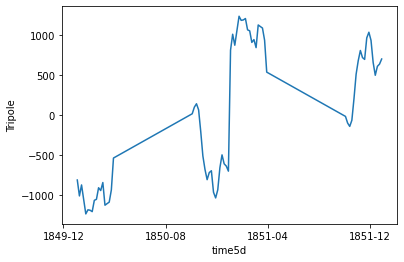

In [105]:
ds_out['Tripole'].plot()

In [52]:
logs = client.get_worker_logs()

In [89]:
logs.keys()

dict_keys(['tls://10.37.26.15:38621', 'tls://10.37.57.3:38889'])

In [60]:
?gateway.cluster_options

Signature: gateway.cluster_options(use_local_defaults=True, **kwargs)
Docstring:
Get the available cluster configuration options.

Parameters
----------
use_local_defaults : bool, optional
    Whether to use any default options from the local configuration.
    Default is True, set to False to use only the server-side defaults.

Returns
-------
cluster_options : dask_gateway.options.Options
    A dict of cluster options.
File:      /srv/conda/envs/notebook/lib/python3.8/site-packages/dask_gateway/client.py
Type:      method


In [91]:
logs['tls://10.37.57.3:38889']

(('INFO',
  'distributed.worker - INFO -       Start worker at:     tls://10.37.57.3:38889'),
 ('INFO',
  'distributed.worker - INFO -          Listening to:     tls://10.37.57.3:38889'),
 ('INFO',
  'distributed.worker - INFO -          dashboard at:            10.37.57.3:8787'),
 ('INFO',
  'distributed.worker - INFO - Waiting to connect to: tls://dask-a3e8bbf6faa9487e9a495fea33a8a7b5.prod:8786'),
 ('INFO',
  'distributed.worker - INFO - -------------------------------------------------'),
 ('INFO',
  'distributed.worker - INFO -               Threads:                          2'),
 ('INFO',
  'distributed.worker - INFO -                Memory:                    8.59 GB'),
 ('INFO',
  'distributed.worker - INFO -       Local Directory: /home/jovyan/dask-worker-space/dask-worker-space/worker-yympgppm'),
 ('INFO',
  'distributed.worker - INFO - -------------------------------------------------'),
 ('INFO',
  'distributed.worker - INFO -         Registered to: tls://dask-a3e8bbf6faa948

In [74]:
with ProgressBar():
    ds_out.load()

KilledWorker: ("('sum-sum-aggregate-305c5fe7e0fe8c2a5e47fa4b4e5dab88', 0, 0, 0)", <Worker 'tls://10.38.162.18:37331', name: dask-worker-54184e0c5c70450783444ba433132f34-7sqng, memory: 0, processing: 463>)

In [75]:
client.get_worker_logs()

{'tls://10.38.162.18:35115': (('INFO',
   'distributed.worker - INFO -       Start worker at:   tls://10.38.162.18:35115'),
  ('INFO',
   'distributed.worker - INFO -          Listening to:   tls://10.38.162.18:35115'),
  ('INFO',
   'distributed.worker - INFO -          dashboard at:          10.38.162.18:8787'),
  ('INFO',
   'distributed.worker - INFO - Waiting to connect to: tls://dask-54184e0c5c70450783444ba433132f34.prod:8786'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO -               Threads:                          2'),
  ('INFO',
   'distributed.worker - INFO -                Memory:                    8.59 GB'),
  ('INFO',
   'distributed.worker - INFO -       Local Directory: /home/jovyan/dask-worker-space/dask-worker-space/worker-dewzneks'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO - 